# Install dependencies

In [ ]:
!pip install top2vec[sentence_encoders]

#Import

In [ ]:
import pandas as pd
import numpy as np
import pickle
from top2vec import Top2Vec
import plotly.express as px

# Mount drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Initialization

In [ ]:
DATASET = 'Dataset-yahoo-answer/'
PATH = '/content/gdrive/MyDrive/'+DATASET
NUM_TOPICS = 20 # for reduced topics

# Load data

In [ ]:
with open(PATH+'top2vec/saved/data.pkl', 'rb') as file:
    df = pickle.load(file)

In [ ]:
df

,topic,title,question,answer,processed_answer,pred_topics,reduced_topic,reduced_topic_score
0,9,What makes friendship click?,How does the spark keep going?,good communication is what does it. Can you m...,good communication move beyond small talk say ...,16,0,0.542340
1,2,Why does Zebras have stripes?,What is the purpose or those stripes? Who do t...,this provides camouflage - predator vision is ...,provide camouflage predator vision usually dif...,41,2,0.258722
2,4,What did the itsy bitsy sipder climb up?,NaN,waterspout,waterspout,56,8,0.403495
3,4,What is the difference between a Bachelors and...,NaN,One difference between a Bachelors and a Maste...,one difference bachelor master degree requirem...,24,5,0.503336
4,3,Why do women get PMS?,NaN,Premenstrual syndrome (PMS) is a group of symp...,premenstrual syndrome pm group symptom relate ...,46,3,0.441360
...,...,...,...,...,...,...,...,...
59995,9,"if you could be any fantasy figure, who would ...",NaN,"The invisible man, I'd be straight into the gi...",invisible man straight girl change room,66,11,0.230436
59996,8,Tell me something about life most people don't...,"Do you know anything about life, or words of w...",That there is a hell and everyone thinks their...,hell everyone think go world go dont turn god ...,0,15,0.462794
59997,3,Why are men always thinking of sex?,NaN,It's wired in our brain,wire brain,19,8,0.495684
59998,6,est ce que DOMENECH est un entraineur: 1: de f...,NaN,de foot mais pas pour être sélectionneur d'une...,de foot mais pa pour tre lectionneur une quipe...,218,6,0.399540


# Load model

In [ ]:
with open(PATH+'top2vec/saved/top2vec.model', 'rb') as file:
    model = pickle.load(file)

# model = Top2Vec.load(PATH+'top2vec/saved/to2vec.mdl')

# Helper functions

In [ ]:
def plot_most_freq_topics(dominant_topics, filename):
    '''
    This function produces a barplot of topic by number of documents prominently
    represented.
    
    Inputs:
        dominant_topics: a (n,) numpy array where n indicates the
        number of documents. Each entry in the array is the most prominant
        topic for that corresponding document
        
    '''
    df = pd.DataFrame({
        'Dominant topic': dominant_topics,

    })
    
    fig = px.histogram(df, x='Dominant topic', hover_data=['Dominant topic'], color='Dominant topic')
    fig.write_html(filename)
    fig.show()

In [ ]:
def plot_reduced_wordcloud(df, model):
    '''
    This function produces the wordcloud for reduced topics
    
    Inputs:
        df: pandas dataframe need to have reduced_topics column
        
        model: to2vec trained model
        
    Returns:
        None
        
    Displays:
        wordcloud for each topics
    '''
    topic_nums = df['reduced_topic']
    
    topic_nums = np.unique(topic_nums)
    for topic in topic_nums:
        model.generate_topic_wordcloud(topic, reduced = True)

# Model and topic investigation

In [ ]:
model.get_num_topics()

354

In [ ]:
plot_most_freq_topics(df['reduced_topic'].to_numpy(),PATH+'top2vec/most_freq_topics_reduced.html')

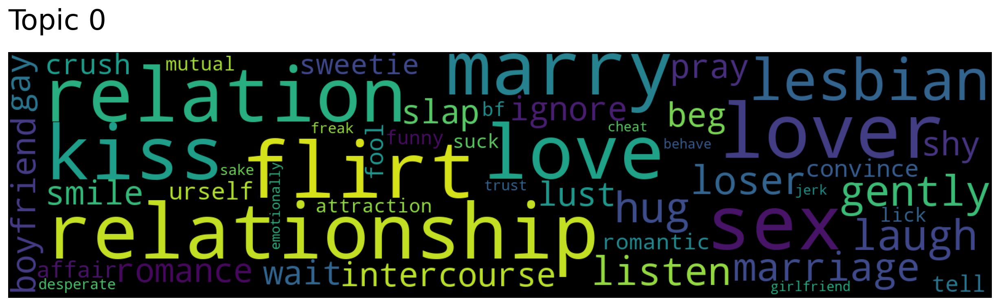

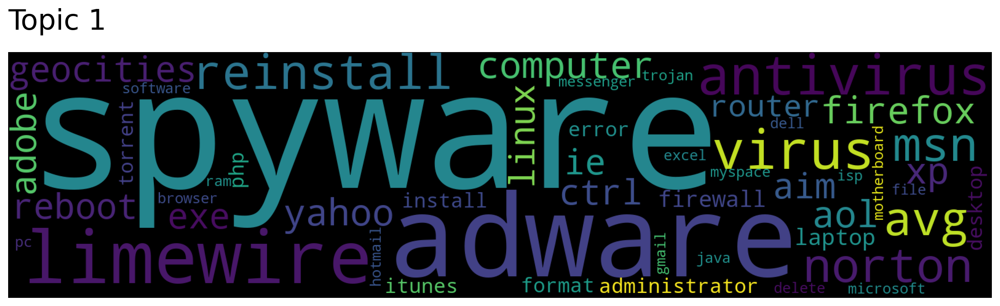

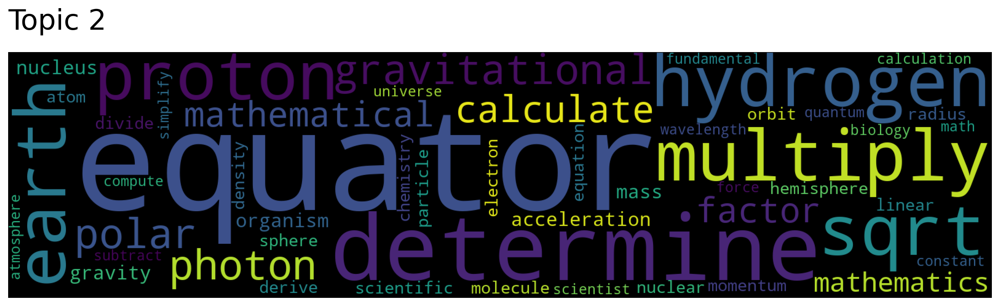

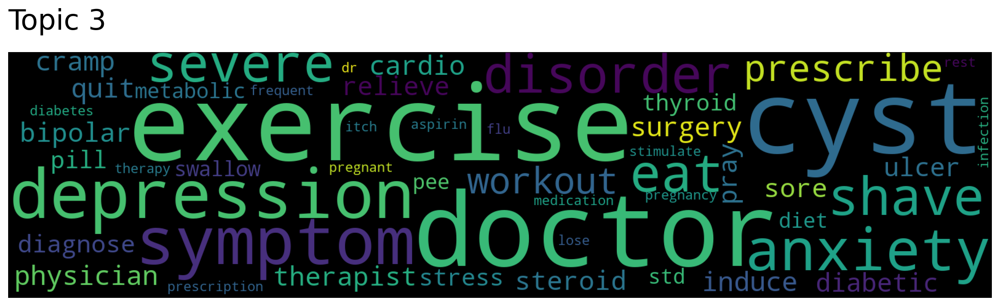

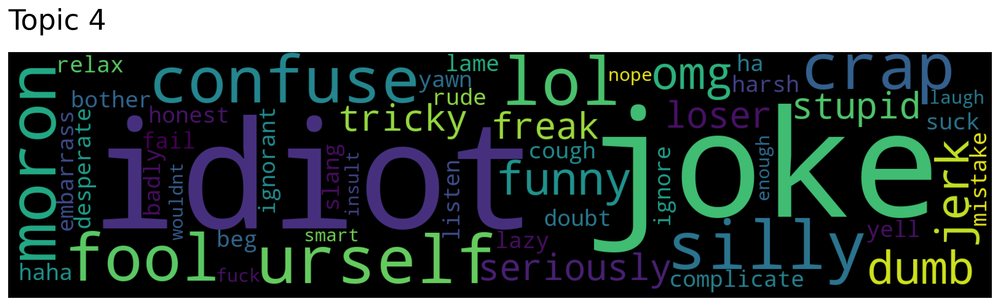

...

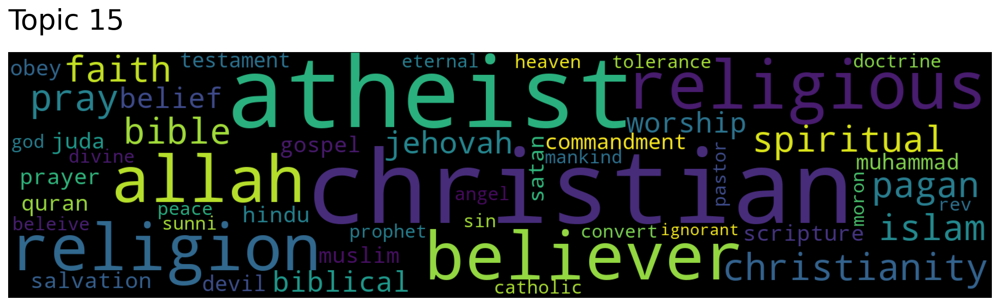

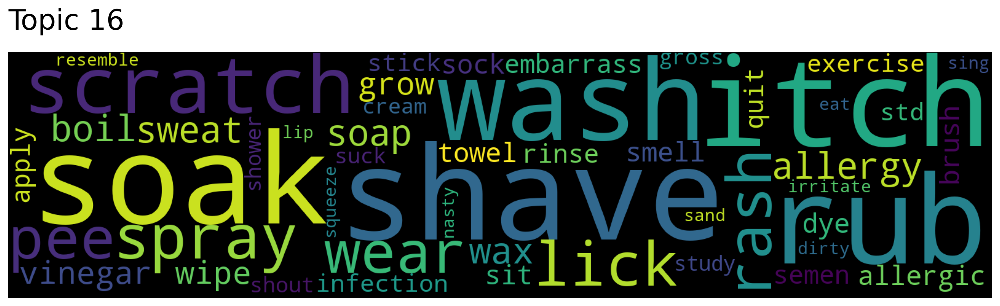

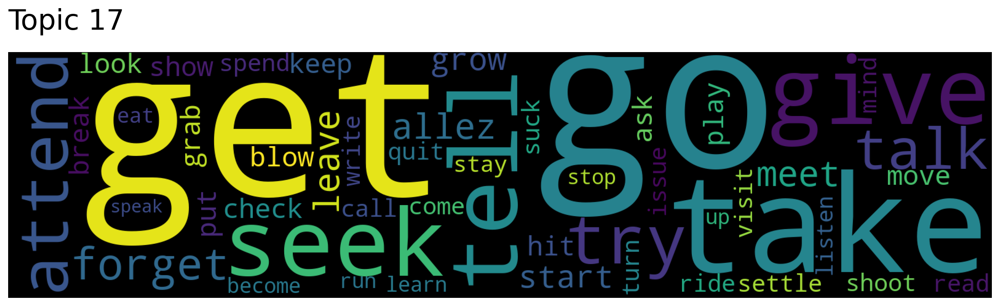

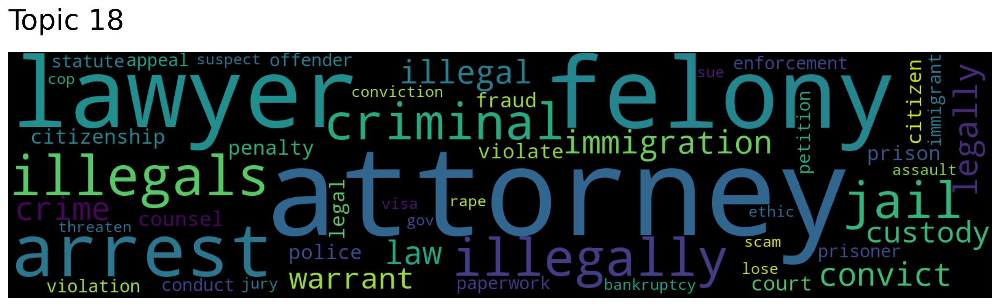

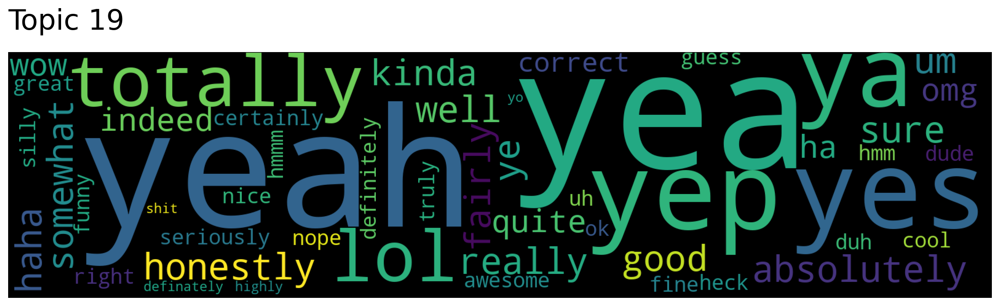

In [ ]:
plot_reduced_wordcloud(df, model)

# Topic Labeling

In [ ]:
# topic_name = {0: 'relationship', 1:'technology', 2: 'science', 3: 'health', 4: '_', 5: 'education', 
#               6: 'sports', 7:'politics', 8: '_', 9:'business', 10: 'education', 
#               11:'crime', 12:'entertainment', 13:'internet', 14:'_', 15: 'religion', 
#               16: '_', 17: '_', 18:'law', 19: '_'}

# with open(PATH+'/top2vec/saved/dictionary_topic_name.dict', 'wb') as file:
#     pickle.dump(topic_name, file)

## Check words topic-wise

In [ ]:
TOPIC_NUM = 0  # topic number to investigate
NUM_DOCS = 5   # number of documents to serch topic-wise
NUM_TOPICS = 10  # number of topics to search for related keywords
NUM_WORDS = 20  # number of words per topic

In [ ]:
# reduced space 
model.topic_words_reduced[TOPIC_NUM][:NUM_WORDS]

# # full space
# model.topic_words[TOPIC_NUM][:NUM_WORDS]

array(['transfer', 'transferwise', 'international', 'withdraw',
       'recipient', 'deposit', 'money', 'bank', 'account', 'fee', 'send',
       'save', 'tfsa', 'gic', 'cancel', 'rsp', 'fund', 'amount',
       'institution', 'sign'], dtype='<U13')

## Search for representative documents topic-wise

In [ ]:
# reduced space
documents, document_scores, document_ids = model.search_documents_by_topic(topic_num=TOPIC_NUM, num_docs=NUM_DOCS, reduced = True)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()


# # full space
# documents, document_scores, document_ids = model.search_documents_by_topic(topic_num=TOPIC_NUM, num_docs=NUM_DOCS)
# for doc, score, doc_id in zip(documents, document_scores, document_ids):
#     print(f"Document: {doc_id}, Score: {score}")
#     print("-----------")
#     print(doc)
#     print("-----------")
#     print()

Document: 1543, Score: 0.8903360962867737
-----------
cancel international money transfer transfer submit
-----------

Document: 1105, Score: 0.8861790895462036
-----------
international money transfer send money save account fuel transfer
-----------

Document: 1345, Score: 0.8727492094039917
-----------
cancel international money transfer
-----------

Document: 899, Score: 0.8727492094039917
-----------
cancel international money transfer
-----------

Document: 1922, Score: 0.8727492094039917
-----------
cancel international money transfer
-----------

